## Import Libraries

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import os
import glob
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D,GlobalAveragePooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam

import warnings
warnings.filterwarnings('ignore')

import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)


In [2]:
print(tf.__version__)

2.4.1


In [3]:
def get_files(base_dir, target_dir):
    count = 0
    path = get_path(base_dir, target_dir)
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            count+=len(glob.glob(os.path.join(dirname, filename)))
        return path, count
    
def get_path(base_dir, target_dir):
    path = os.path.join(base_dir,target_dir)
    return path

## Directory Setup

In [4]:
base_dir = '/kaggle/input/cassava-leaf-disease-classification'
train_dir = 'train_images'
labels_file = 'train.csv'
test_dir = 'test_images'
json_file = 'label_num_to_disease_map.json'

train_path, train_count = get_files(base_dir,train_dir)
test_path, test_count = get_files(base_dir,test_dir)

with open(get_path(base_dir,json_file)) as f:
    class_names = json.load(f)
    class_dict = pd.Series(class_names.values()).to_dict()
    f.close()

data = pd.read_csv(get_path(base_dir, labels_file))
data['class_name'] = data.label.map(class_dict)

print("No of Train Images: {}".format(train_count))
print("No of Test Images: {}".format(test_count))
print("No of Classes: {}".format(len(class_dict)))
print("Classes:")
for v in class_dict.values():
    print(" \u2022 {}".format(v))

No of Train Images: 21397
No of Test Images: 1
No of Classes: 5
Classes:
 • Cassava Bacterial Blight (CBB)
 • Cassava Brown Streak Disease (CBSD)
 • Cassava Green Mottle (CGM)
 • Cassava Mosaic Disease (CMD)
 • Healthy


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    21397 non-null  object
 1   label       21397 non-null  int64 
 2   class_name  21397 non-null  object
dtypes: int64(1), object(2)
memory usage: 501.6+ KB


<AxesSubplot:>

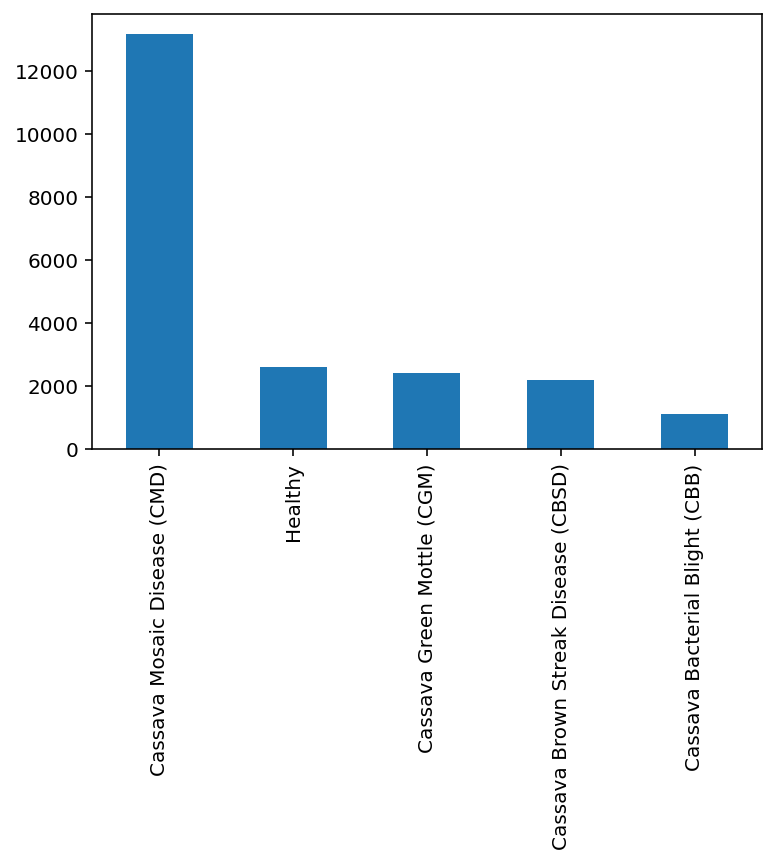

In [6]:
data['class_name'].value_counts().plot(kind='bar')

In [7]:
for dirname, _, filenames in os.walk(train_path):
    for filename in filenames:
        image = cv2.imread(os.path.join(train_path, filename))
        image_size = image.shape
        break

image_size

(600, 800, 3)

## Visualization

<Figure size 1080x1080 with 0 Axes>

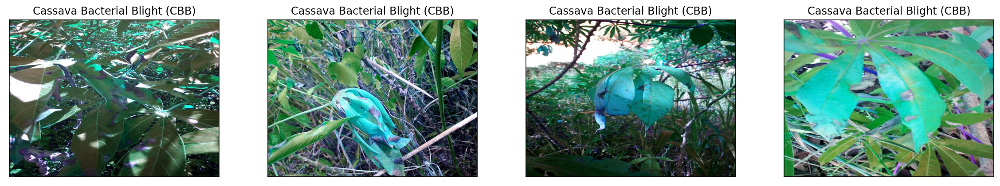

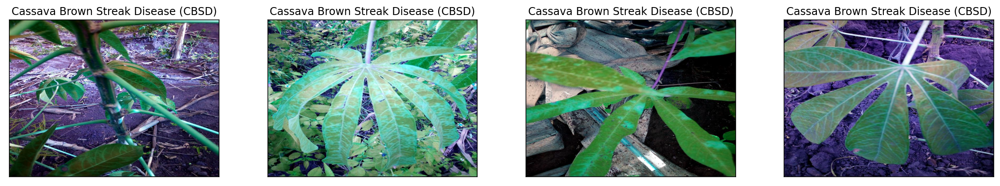

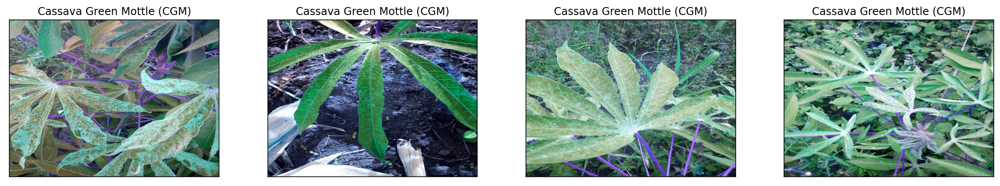

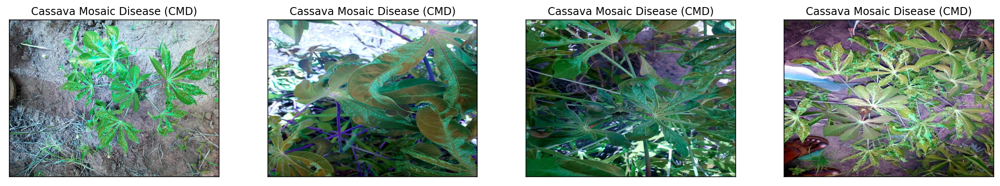

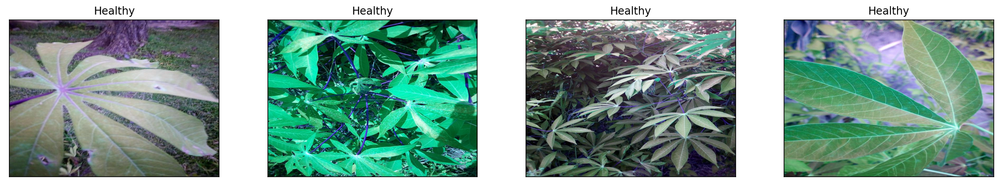

In [11]:
def visualize_img(images):
    fig = plt.figure(figsize=(20, 15))
    for i,a in enumerate(images):
        fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
        path = get_path(train_path, a)
        img = cv2.imread(path)
        plt.imshow(img)
        plt.title(data[data.image_id == a].class_name.values[0])
    
fig = plt.figure(figsize=(15, 15))
p=0
for i in range(5):
    images = data[data.label == i].image_id
    images = np.random.choice(images , 4)
    visualize_img(images)

In [12]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

## Example of Image Augmentation

In [16]:
BATCH_SIZE = 64
IMG_SHAPE  = 224

train_image_gen = ImageDataGenerator(rescale=1./255,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     brightness_range=[0.2,1.0],
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=True,
                                     fill_mode='nearest')

train_gen = train_image_gen.flow_from_dataframe(data,
                                          directory=train_path,
                                          x_col='image_id',
                                          y_col='class_name',
                                          class_mode='categorical',
                                          batch_size=BATCH_SIZE,
                                          shuffle=True,
                                          target_size=(IMG_SHAPE,IMG_SHAPE))

Found 21397 validated image filenames belonging to 5 classes.


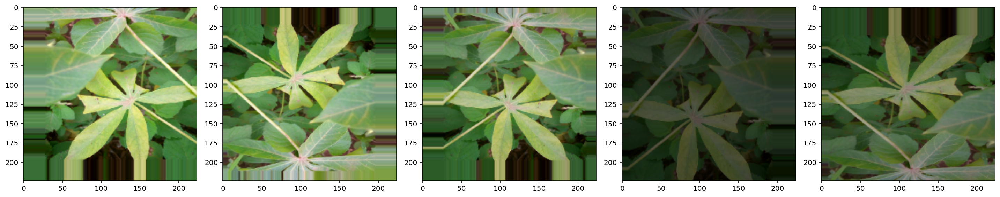

In [20]:
augmented_images = [train_gen[0][0][1] for i in range(5)]
plotImages(augmented_images)

## Data Preprocessing

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer

train, val = train_test_split(data, test_size = 0.25, random_state=42)

lb = LabelBinarizer()
lb.fit(data.label)

train_lb = lb.transform(train.label)
val_lb = lb.transform(val.label)

train = train.reset_index().drop(labels='index', axis=1)
y_train = pd.DataFrame(train_lb).add_prefix('label_')

val = val.reset_index().drop(labels='index', axis=1)
y_val = pd.DataFrame(val_lb).add_prefix('label_')

train = pd.concat([train, y_train], axis=1)
val = pd.concat([val, y_val], axis=1)

print("Training set has {} samples".format(train.shape[0]))
print("Validation set has {} samples".format(val.shape[0]))

Training set has 16047 samples
Validation set has 5350 samples


### Helper Functions

In [9]:
BATCH_SIZE = 32
IMG_SHAPE  = 224
EPOCHS = 30

def gen():
    train_image_gen = ImageDataGenerator(rescale=1./255,
                                         width_shift_range=0.1,
                                         height_shift_range=0.1,
                                         brightness_range=[0.2,1.0],
                                         zoom_range=0.2,
                                         horizontal_flip=True,
                                         vertical_flip=True,
                                         fill_mode='nearest')

    train_gen = train_image_gen.flow_from_dataframe(train,
                                              directory=train_path,
                                              x_col='image_id',
                                              y_col=[f'label_{x}' for x in np.arange(5)],
                                              class_mode='raw',
                                              batch_size=BATCH_SIZE,
                                              shuffle=True,
                                              target_size=(IMG_SHAPE,IMG_SHAPE))


    val_image_gen = ImageDataGenerator(rescale=1./255)

    val_gen = val_image_gen.flow_from_dataframe(val,
                                              directory=train_path,
                                              x_col='image_id',
                                              y_col= [f'label_{x}' for x in np.arange(5)],
                                              class_mode='raw',
                                              batch_size=BATCH_SIZE,
                                              target_size=(IMG_SHAPE,IMG_SHAPE))
    return train_gen, val_gen


In [10]:
def plot(history):

    training_accuracy = history.history['accuracy']
    validation_accuracy = history.history['val_accuracy']

    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']

    epochs_range=range(len(training_accuracy))

    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, training_accuracy, label='Training Accuracy')
    plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, training_loss, label='Training Loss')
    plt.plot(epochs_range, validation_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

In [11]:
from PIL import Image
def predict(image_path, model):
    im = Image.open(image_path)
    test_image = np.asarray(im)
    processed_test_image = process_image(test_image)
    processed_test_image = np.expand_dims(processed_test_image, axis = 0)
    
    ps = model.predict(processed_test_image)
    return ps
    
def process_image(image):
    image = tf.cast(image , tf.float32)
    image = tf.image.resize(image , (224 , 224))
    image = image/255
    image = image.numpy()
    return image


In [25]:
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight('balanced', np.unique(train['label']), train.label)
class_weights = dict(enumerate(class_weights))
class_weights

{0: 3.923471882640587,
 1: 1.9333734939759035,
 2: 1.7643760307861462,
 3: 0.3275566442131047,
 4: 1.6441598360655738}

## Modeling

1. **VGG-16 Model** 

In [26]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess
tf.keras.backend.clear_session()

base = VGG16(weights = 'imagenet' , include_top=False, input_shape=(IMG_SHAPE, IMG_SHAPE, 3))   

vgg16_model = Sequential()
vgg16_model.add(base)
vgg16_model.add(GlobalAveragePooling2D())
vgg16_model.add(Dropout(0.5))
vgg16_model.add(BatchNormalization())
vgg16_model.add(Dense(128, activation='relu'))
vgg16_model.add(Dropout(0.5))
vgg16_model.add(Dense(5, activation='softmax'))

vgg16_model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
batch_normalization (BatchNo (None, 512)               2048      
_________________________________________________________________
dense (Dense)                (None, 128)               65664     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________

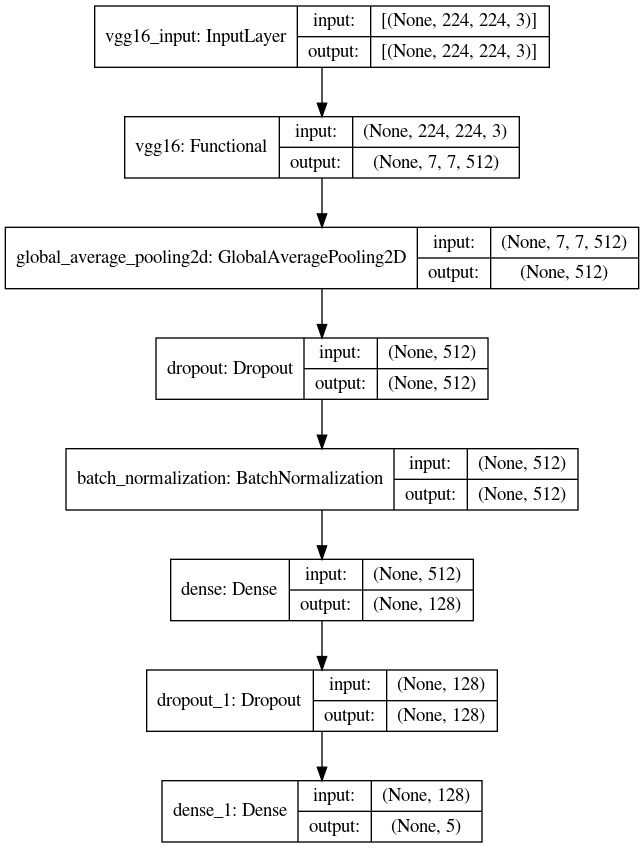

In [27]:
from keras.utils.vis_utils import plot_model
plot_model(vgg16_model, to_file='vgg16_model.png', show_shapes=True, show_layer_names=True)

In [28]:
train_gen, val_gen = gen()

optm = Adam(lr=0.0001)
vgg16_model.compile(loss='categorical_crossentropy', optimizer=optm, 
                  metrics=['accuracy'])

EarlyStopping = EarlyStopping(monitor='val_loss',
                              min_delta=.0001,
                              patience=5,
                              verbose=1,
                              mode='auto',
                              baseline=None,
                              restore_best_weights=True)

model_save = ModelCheckpoint('./vgg16.h5',
                             save_best_only = True, 
                             save_weights_only = False,
                             monitor = 'val_loss', 
                             mode = 'min', verbose = 1)


vgg_history = vgg16_model.fit_generator(train_gen,
                                    steps_per_epoch = train_gen.samples // BATCH_SIZE,
                                    epochs = 30,
                                    validation_data = val_gen,
                                    validation_steps = val_gen.samples // BATCH_SIZE,
                                    callbacks=[EarlyStopping, model_save])

Found 16047 validated image filenames.
Found 5350 validated image filenames.
Epoch 1/30
501/501 [==============================] - 536s 1s/step - loss: 1.3894 - accuracy: 0.4546 - val_loss: 0.8917 - val_accuracy: 0.6710

Epoch 00001: val_loss improved from inf to 0.89172, saving model to ./vgg16.h5
Epoch 2/30
501/501 [==============================] - 414s 826ms/step - loss: 0.9785 - accuracy: 0.6384 - val_loss: 2.0417 - val_accuracy: 0.6480

Epoch 00002: val_loss did not improve from 0.89172
Epoch 3/30
501/501 [==============================] - 418s 834ms/step - loss: 0.8756 - accuracy: 0.6734 - val_loss: 0.8036 - val_accuracy: 0.7208

Epoch 00003: val_loss improved from 0.89172 to 0.80362, saving model to ./vgg16.h5
Epoch 4/30
501/501 [==============================] - 421s 840ms/step - loss: 0.7996 - accuracy: 0.6987 - val_loss: 0.7330 - val_accuracy: 0.7296

Epoch 00004: val_loss improved from 0.80362 to 0.73303, saving model to ./vgg16.h5
Epoch 5/30
501/501 [======================

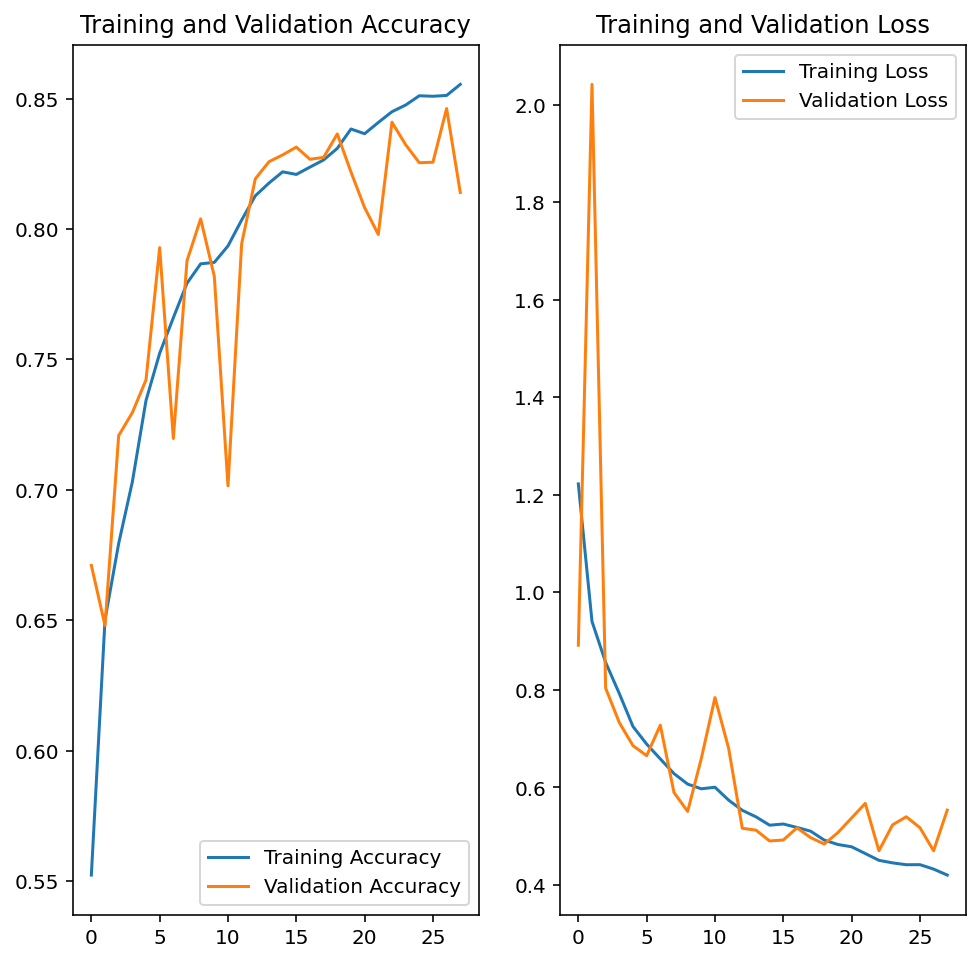

In [44]:
plot(vgg_history)

In [45]:
test_images = os.listdir(test_path)    
for image in test_images:
    vgg16_pred = predict(os.path.join(test_path, image) , vgg16_model)

In [46]:
vgg16_pred

array([[0.01289593, 0.02748206, 0.5555748 , 0.27868327, 0.125364  ]],
      dtype=float32)

In [47]:
np.argmax(vgg16_pred)

2

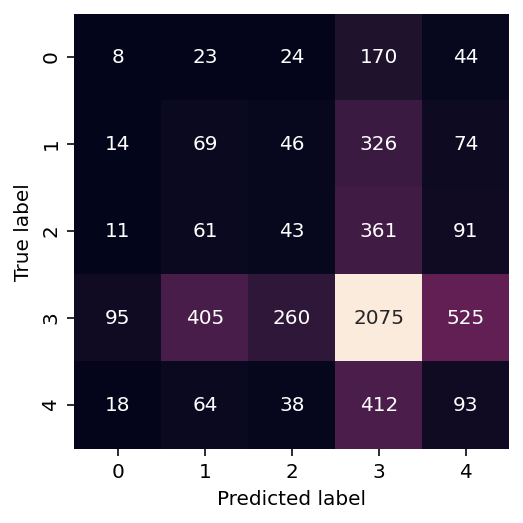

In [48]:
vgg16_preds = vgg16_model.predict(val_gen)
vgg16_preds = np.argmax(vgg16_preds, axis=-1)
org_label = val['label'].astype('int')

matrix=confusion_matrix(org_label, vgg16_preds)
sns.heatmap(matrix,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['0', '1', '2', '3', '4'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.xlabel('Predicted label')
plt.ylabel('True label');


2. MobileNetV2

In [41]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

base = MobileNetV2(weights = 'imagenet', include_top = False, input_shape = (224, 224, 3))
tf.keras.backend.clear_session()

for layers in base.layers:   
    layers.trainable = True
    
for layer in base.layers[:100]:
    layer.trainable =  False

mobilenet_model = Sequential()
mobilenet_model.add(base)
mobilenet_model.add(GlobalAveragePooling2D())
mobilenet_model.add(BatchNormalization())
mobilenet_model.add(Dense(256, activation='relu'))
mobilenet_model.add(Dropout(0.5))
mobilenet_model.add(BatchNormalization())
mobilenet_model.add(Dense(128, activation='relu'))
mobilenet_model.add(Dropout(0.5))
mobilenet_model.add(Dense(5, activation='softmax'))

mobilenet_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1280)              5120      
_________________________________________________________________
dense (Dense)                (None, 256)               327936    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               3

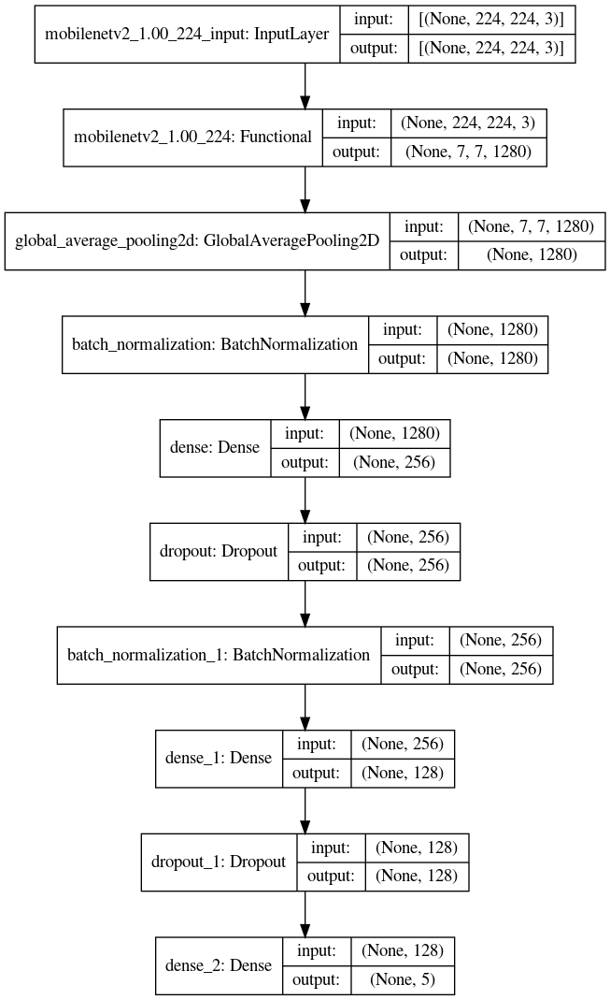

In [42]:
from keras.utils.vis_utils import plot_model
plot_model(mobilenet_model, to_file='mobilenetV2.png', show_shapes=True, show_layer_names=True)

In [48]:
train_gen, val_gen = gen()

optm = Adam(lr=0.0001)
mobilenet_model.compile(loss='categorical_crossentropy', optimizer=optm, 
                  metrics=['accuracy'])

EarlyStopping = EarlyStopping(monitor='val_loss',
                              min_delta=.0001,
                              patience=3,
                              verbose=1,
                              mode='auto',
                              baseline=None,
                              restore_best_weights=True)

model_save = ModelCheckpoint('./mobilenetV2.h5',
                             save_best_only = True,
                             save_weights_only = False,
                             monitor = 'val_loss', 
                             mode = 'min', verbose = 1)


mob_history = mobilenet_model.fit(train_gen,
                              steps_per_epoch = train_gen.samples // BATCH_SIZE,
                              epochs = EPOCHS,
                              validation_data = val_gen,
                              validation_steps = val_gen.samples // BATCH_SIZE,
                              callbacks=[EarlyStopping, model_save])

Found 16047 validated image filenames.
Found 5350 validated image filenames.
Epoch 1/30
501/501 [==============================] - 352s 696ms/step - loss: 1.7639 - accuracy: 0.3821 - val_loss: 1.1445 - val_accuracy: 0.6860

Epoch 00001: val_loss improved from inf to 1.14449, saving model to ./mobilenetV2.h5
Epoch 2/30
501/501 [==============================] - 348s 695ms/step - loss: 1.0538 - accuracy: 0.6277 - val_loss: 0.8564 - val_accuracy: 0.7158

Epoch 00002: val_loss improved from 1.14449 to 0.85635, saving model to ./mobilenetV2.h5
Epoch 3/30
501/501 [==============================] - 348s 694ms/step - loss: 0.9014 - accuracy: 0.6666 - val_loss: 0.7227 - val_accuracy: 0.7444

Epoch 00003: val_loss improved from 0.85635 to 0.72268, saving model to ./mobilenetV2.h5
Epoch 4/30
501/501 [==============================] - 349s 696ms/step - loss: 0.8468 - accuracy: 0.6838 - val_loss: 0.8882 - val_accuracy: 0.7565

Epoch 00004: val_loss did not improve from 0.72268
Epoch 5/30
501/501 [=

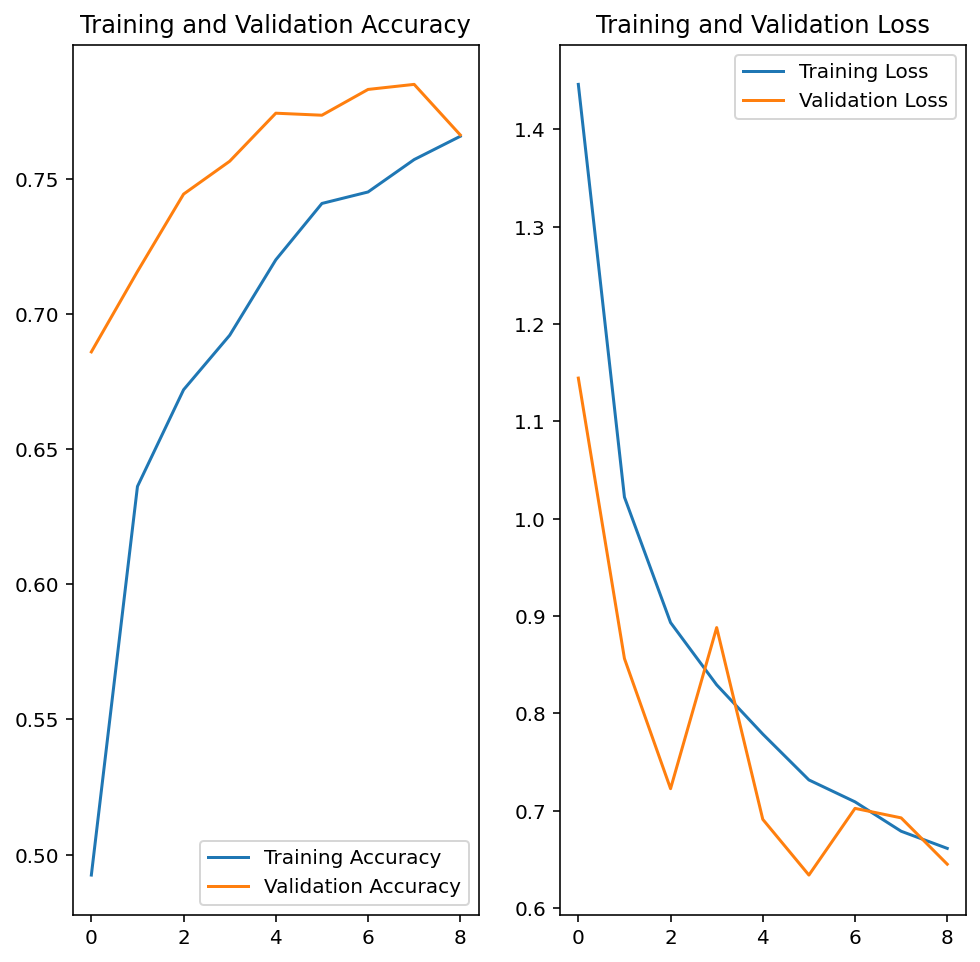

In [51]:
plot(mob_history)

In [63]:
print(mob_history.history['val_accuracy'][-4])
print(mob_history.history['val_loss'][-4])

0.773577868938446
0.6339364647865295


In [53]:
test_images = os.listdir(test_path)    
for image in test_images:
    mobilenet_pred = predict(os.path.join(test_path, image) , mobilenet_model)

In [54]:
mobilenet_pred

array([[0.0044814 , 0.00423352, 0.34947184, 0.10747987, 0.5343334 ]],
      dtype=float32)

In [55]:
np.argmax(mobilenet_pred)

4

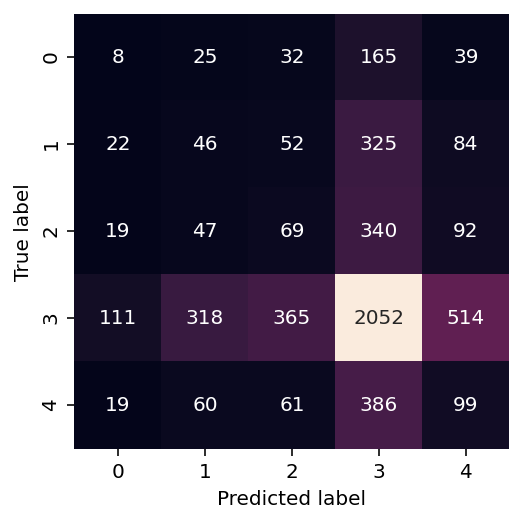

In [56]:
mob_preds = mobilenet_model.predict(val_gen)
mob_preds = np.argmax(mob_preds, axis=-1)
org_label = val['label'].astype('int')

matrix=confusion_matrix(org_label, mob_preds)
sns.heatmap(matrix,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['0', '1', '2', '3', '4'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.xlabel('Predicted label')
plt.ylabel('True label');

3. DenseNet169

In [12]:
from tensorflow.keras.applications.densenet import DenseNet169
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess
base = DenseNet169(weights = 'imagenet', include_top = False, input_shape = (224, 224, 3))
tf.keras.backend.clear_session()

for layer in base.layers:   
    layer.trainable = False

densenet_model = Sequential()
densenet_model.add(base)
densenet_model.add(GlobalAveragePooling2D())
densenet_model.add(BatchNormalization())
densenet_model.add(Dense(256, activation='relu'))
densenet_model.add(Dropout(0.5))
densenet_model.add(BatchNormalization())
densenet_model.add(Dense(128, activation='relu'))
densenet_model.add(Dropout(0.5))
densenet_model.add(Dense(5, activation='softmax'))

densenet_model.summary()

51879936/51877672 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet169 (Functional)     (None, 7, 7, 1664)        12642880  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1664)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1664)              6656      
_________________________________________________________________
dense (Dense)                (None, 256)               426240    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________

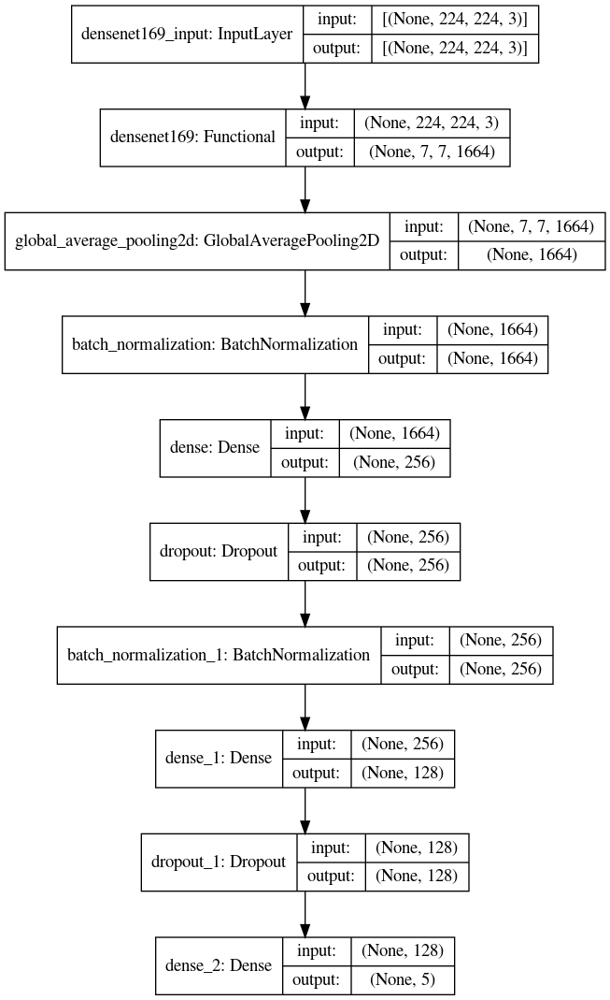

In [13]:
from keras.utils.vis_utils import plot_model
plot_model(densenet_model, to_file='densenet169.png', show_shapes=True, show_layer_names=True)

In [14]:
train_gen, val_gen = gen()

optm = Adam(lr=0.0001)
densenet_model.compile(loss='categorical_crossentropy', optimizer=optm, 
                  metrics=['accuracy'])

EarlyStopping = EarlyStopping(monitor='val_loss',
                              min_delta=.0001,
                              patience=5,
                              verbose=1,
                              mode='auto',
                              baseline=None,
                              restore_best_weights=True)

model_save = ModelCheckpoint('./densenet.h5',
                             save_best_only = True,
                             save_weights_only = False,
                             monitor = 'val_loss', 
                             mode = 'min', verbose = 1)


dense_history = densenet_model.fit_generator(train_gen,
                              steps_per_epoch = train_gen.samples // BATCH_SIZE,
                              epochs = EPOCHS,
                              validation_data = val_gen,
                              validation_steps = val_gen.samples // BATCH_SIZE,
                              callbacks=[EarlyStopping, model_save])

Found 16047 validated image filenames.
Found 5350 validated image filenames.
Epoch 1/30
501/501 [==============================] - 517s 1s/step - loss: 2.0072 - accuracy: 0.3172 - val_loss: 0.9138 - val_accuracy: 0.6712

Epoch 00001: val_loss improved from inf to 0.91376, saving model to ./densenet.h5
Epoch 2/30
501/501 [==============================] - 360s 718ms/step - loss: 1.2656 - accuracy: 0.5777 - val_loss: 0.8287 - val_accuracy: 0.6939

Epoch 00002: val_loss improved from 0.91376 to 0.82873, saving model to ./densenet.h5
Epoch 3/30
501/501 [==============================] - 358s 715ms/step - loss: 1.1522 - accuracy: 0.6063 - val_loss: 0.8141 - val_accuracy: 0.6985

Epoch 00003: val_loss improved from 0.82873 to 0.81406, saving model to ./densenet.h5
Epoch 4/30
501/501 [==============================] - 354s 707ms/step - loss: 1.0556 - accuracy: 0.6300 - val_loss: 0.7868 - val_accuracy: 0.7051

Epoch 00004: val_loss improved from 0.81406 to 0.78679, saving model to ./densenet.h

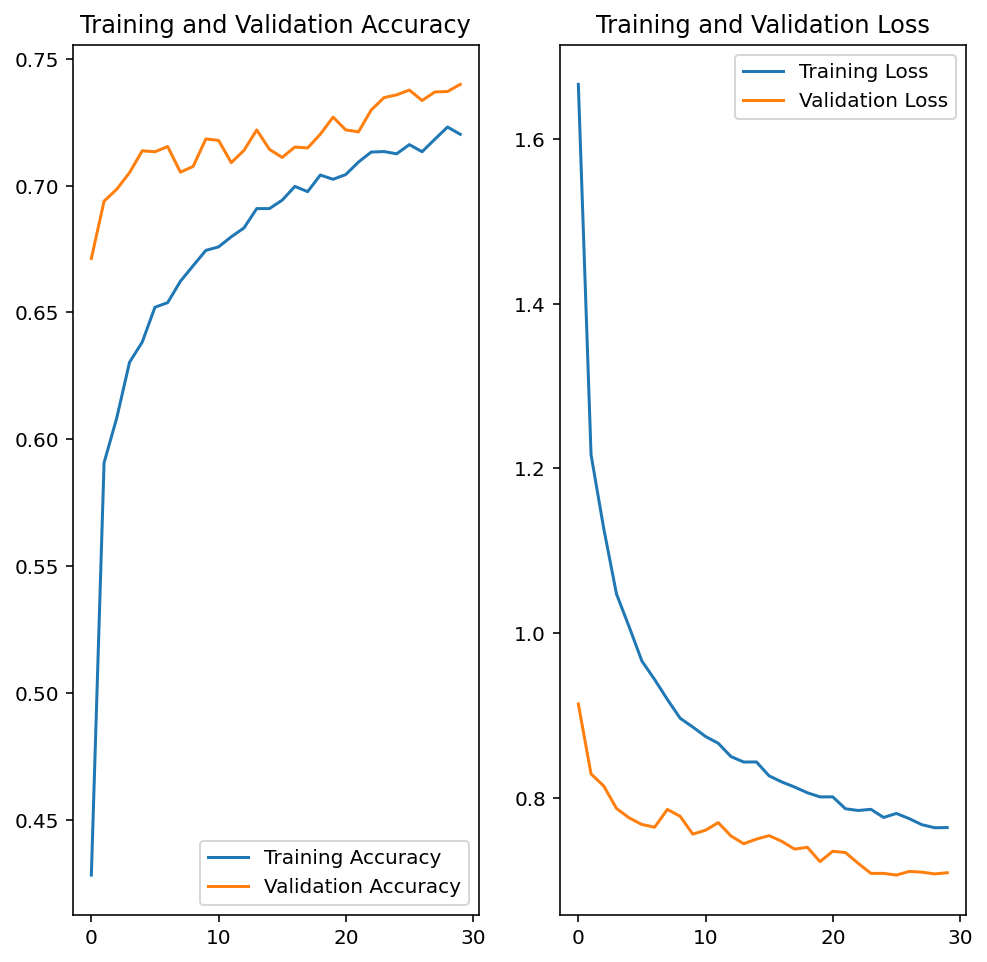

In [25]:
plot(dense_history)

In [26]:
print(dense_history.history['val_accuracy'][-5])
print(dense_history.history['val_loss'][-5])

0.73764967918396
0.7058742642402649


In [27]:
test_images = os.listdir(test_path)    
for image in test_images:
    densenet_pred = predict(os.path.join(test_path, image) , densenet_model)

In [28]:
densenet_pred

array([[0.00154506, 0.00538246, 0.22577596, 0.30233517, 0.46496138]],
      dtype=float32)

In [29]:
np.argmax(densenet_pred)

4

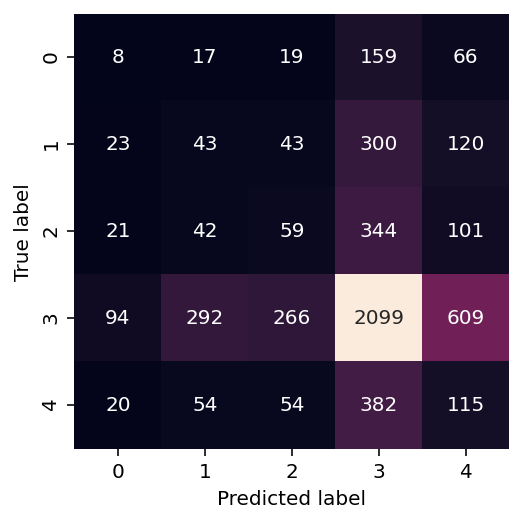

In [30]:
dense_preds = densenet_model.predict(val_gen)
dense_preds = np.argmax(dense_preds, axis=-1)
org_label = val['label'].astype('int')

matrix=confusion_matrix(org_label, dense_preds)
sns.heatmap(matrix,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['0', '1', '2', '3', '4'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.xlabel('Predicted label')
plt.ylabel('True label');

## Ensemble

In [18]:
mobilenet_model = tf.keras.models.load_model("../input/cassava-models/mobilenetV2.h5")
vgg_model = tf.keras.models.load_model("../input/cassava-models/vgg16.h5")
densenet_model = tf.keras.models.load_model("../input/cassava-models/densenet.h5")

In [19]:
model1_list=[]
model2_list=[]
model3_list = []
predicted_label_list = []
actual_labels=[]

val_images = val.image_id
for i in val_images:
    actual_labels.append(int(val[val.image_id == i].label))   
actual_labels = pd.Series(actual_labels)

for image in val_images:
    model1_list.append(predict(os.path.join(train_path, image), densenet_model))
    model2_list.append(predict(os.path.join(train_path, image), mobilenet_model))
    model3_list.append(predict(os.path.join(train_path, image), vgg_model))

for dense, mob, vgg in zip(model1_list, model2_list, model3_list):
    predicted_label_list.append(np.argmax(dense/np.linalg.norm(dense) + mob/np.linalg.norm(mob) + vgg/np.linalg.norm(vgg)))
    
print(classification_report(actual_labels, predicted_label_list))

              precision    recall  f1-score   support

           0       0.70      0.38      0.49       269
           1       0.75      0.79      0.77       529
           2       0.90      0.56      0.69       567
           3       0.94      0.97      0.95      3360
           4       0.59      0.78      0.67       625

    accuracy                           0.86      5350
   macro avg       0.78      0.70      0.72      5350
weighted avg       0.86      0.86      0.85      5350



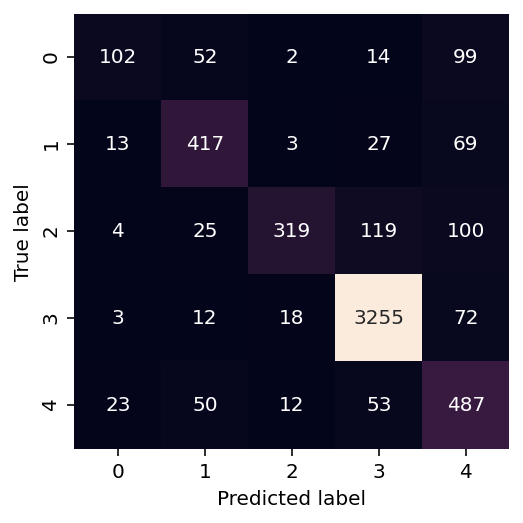

In [21]:
matrix=confusion_matrix(actual_labels, predicted_label_list)
sns.heatmap(matrix,square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['0', '1', '2', '3', '4'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.xlabel('Predicted label')
plt.ylabel('True label')